# Google Colabを利用してますでしょうか？
以下のコードを実行してください。
- API_KEYを取得・書き換え

```sh
# ===============================
# 🔑 APIキーの設定
# ===============================
# https://console.upstage.ai/api-keys
os.environ["UPSTAGE_API_KEY"] = "YOUR_API_KEY"
print("🔐 Upstage APIキーを設定しました")

# https://wandb.ai/authorize (https://docs.wandb.ai/ja/support/find_api_key/ に解説があります)
os.environ["WANDB_API_KEY"] = "YOUR_API_KEY"
print("🔐 WANDB APIキーを設定しました")
```

他の設定は入りません。

In [ ]:
import os

# ===============================
# 🧪 weaveのインストール
# ===============================
print("📦 weave をインストール中...")
!pip install -q weave==0.52.9

# ===============================
# 🔑 Upstage APIキーの設定
# ===============================
# https://console.upstage.ai/api-keys
os.environ["UPSTAGE_API_KEY"] = "YOUR_API_KEY"
print("🔐 Upstage APIキーを設定しました")

# https://wandb.ai/authorize (https://docs.wandb.ai/ja/support/find_api_key/ に解説があります)
os.environ["WANDB_API_KEY"] = "YOUR_API_KEY"
print("🔐 WANDB APIキーを設定しました")

# ===============================
# 📁 パス設定
# ===============================
ZIP_URL = "https://github.com/nhandsome-new/fc_2025_upstage_handson/raw/main/prep_google_colab/demo_imgs.zip"
ZIP_FILE = "demo_imgs.zip"
EXTRACT_DIR = "/content/demo_imgs"

# ===============================
# 📂 フォルダがあるかチェック
# ===============================
if not os.path.exists(EXTRACT_DIR):
    print("📂 フォルダが存在しません。初回セットアップを開始します...")

    # 🧭 1) 既存のフォルダ・ZIPファイルを削除（存在しなくてもOK）
    print("🧭 既存のフォルダ・ZIPファイルを削除中...")
    !rm -rf {EXTRACT_DIR} || true
    !rm -f {ZIP_FILE} || true

    # ⬇️ 2) wgetでZIPファイルをダウンロード
    print(f"⬇️ ZIPファイルをダウンロード中: {ZIP_URL}")
    !wget -q -O {ZIP_FILE} {ZIP_URL}
    print("✅ ダウンロード完了")

    # 📦 3) ZIPファイルを解凍
    print("📦 ZIPファイルを解凍中...")
    !unzip -q {ZIP_FILE} -d .
    print("✅ 解凍完了")

    # 🧼 4) ZIPファイルを削除
    print("🧼 ZIPファイルを削除中...")
    !rm {ZIP_FILE}
    print("✅ ZIPファイル削除完了")

else:
    print("✅ 既にフォルダが存在するため、ダウンロードと解凍はスキップします。")

# ===============================
# 📂 展開結果の確認
# ===============================
print(f"📂 展開結果の確認: {EXTRACT_DIR}")
!ls -l {EXTRACT_DIR}


# 5件の受傷事故報告書の情報抽出結果
## 入力・出力・AI

![](./docs_imgs/Result_1.png)

- AI：申請者・受傷者

---
![](./docs_imgs/Result_2.png)

- AI：和暦・西暦

---
![](./docs_imgs/Result_3.png)

- AI：受傷後の処理

---
![](./docs_imgs/Result_4.png)

- AI：免許は無

---
![](./docs_imgs/Result_5.png)

- AI：受傷の原因・内容

---

## 次：Upstage_HandsOn_3
## Weaveを用いた抽出結果の評価
![](./docs_imgs/Step_3.png)

In [ ]:
# ======================================================
# 📦 1. 必要なライブラリのインポート
# ======================================================
import weave
from weave import Content
import os
import re
import json
import requests
from datetime import datetime
from IPython.display import display, Image, HTML
from typing import Annotated

# ======================================================
# 🚀 2. Weaveの初期化
# ======================================================
weave.init("UPSTAGE-HANDSON-RESULTS")

# ======================================================
# 🔐 3. APIキーの設定
# https://console.upstage.ai/api-keys
# ======================================================
# os.environ["UPSTAGE_API_KEY"] = 'YOUR_API_KEY' # ← 実際のキーをここに入れる

# ======================================================
# ✅ 4. 初期化確認
# ======================================================
print("📚 ライブラリ準備完了!")
print("🎯 Weaveが初期化されました - すべての処理が自動追跡されます")
print(f"🔑 UPSTAGE_API_KEY: {'設定済み' if 'UPSTAGE_API_KEY' in os.environ and os.environ['UPSTAGE_API_KEY'] != 'YOUR_API_KEY' else '❌未設定'}")

# ======================================================
# 🧾 5. Document Parse 関数
# ======================================================
@weave.op()
def upstage_document_parse(file_path: Annotated[str, Content]) -> str:
    """
    📄 文書をHTMLに変換する関数
    - Upstage Document AI API を利用
    - ファイルを送信して OCR + HTML 化
    """
    # Step 1. APIキーを環境変数から取得
    api_key = os.environ.get("UPSTAGE_API_KEY")
    if not api_key:
        raise ValueError("❌ UPSTAGE_API_KEY が環境変数に設定されていません。")

    # Step 2. 画像ファイルをバイナリで読み込み
    with open(file_path, 'rb') as file:
        files = {
            "document": (os.path.basename(file_path), file, "image/jpeg")
        }
        data = {
            "model": "document-parse-nightly",
            "ocr": "auto",
            "output_formats": "html"
        }

        # Step 3. APIリクエスト送信
        response = requests.post(
            "https://api.upstage.ai/v1/document-ai/document-parse",
            headers={"Authorization": f"Bearer {api_key}"},
            files=files,
            data=data
        )

    # Step 4. 結果をJSONで取得してHTML部分を返す
    result = response.json()
    return result.get("content", {}).get("html", "")


# ======================================================
# ☀️ 6. LLM 応答生成関数
# ======================================================
@weave.op()
def upstage_solar_pro2(messages: list) -> str:
    """
    🧠 LLMで応答を生成する関数
    - Solar Pro2 モデルを使用
    - messages には system / user ロールのプロンプトを含む
    """
    # Step 1. APIキーを環境変数から取得
    api_key = os.environ.get("UPSTAGE_API_KEY")
    if not api_key:
        raise ValueError("❌ UPSTAGE_API_KEY が環境変数に設定されていません。")

    # Step 2. リクエストペイロードの構築
    payload = {
        "model": "solar-pro2",
        "messages": messages,
        "temperature": 0.1,
        "max_tokens": 10000
    }

    # Step 3. APIリクエスト送信
    response = requests.post(
        "https://api.upstage.ai/v1/solar/chat/completions",
        headers={
            "Authorization": f"Bearer {api_key}",
            "Content-Type": "application/json"
        },
        json=payload
    )

    # Step 4. 応答メッセージ部分のみを抽出して返す
    result = response.json()
    return result["choices"][0]["message"]["content"]


# ======================================================
# 🖼 7. ファイル情報の表示関数
# ======================================================
def display_document_info(file_path: str, title: str = ""):
    """
    📌 文書ファイルの基本情報を表示
    - ファイル名とサイズを出力
    - JPG/PNG形式の場合は画像を表示
    """
    if os.path.exists(file_path):
        # ファイル情報の出力
        print(f"\n📄 {title}")
        print(f"   ファイル名: {os.path.basename(file_path)}")
        print(f"   サイズ: {os.path.getsize(file_path):,} バイト")

        # 画像プレビュー（対応形式のみ）
        file_ext = os.path.splitext(file_path)[1].lower()
        if file_ext in ['.jpg', '.jpeg', '.png']:
            display(Image(file_path, width=300))
    else:
        print(f"❌ ファイルが見つかりません: {file_path}")

# ======================================================
# 🪜 8. JSON抽出関数
# ------------------------------------------------------
# - LLMの応答テキストから JSON フォーマット部分のみを抽出
# ======================================================
@weave.op()
def extract_json_from_llm_response(content: str):
    content = content.strip()
    match = re.search(r"```json\s*(\{[\s\S]*?\})\s*```", content)
    if match:
        content = match.group(1)
    return json.loads(content)

# ================================
# 🚀 メインパイプライン
# ================================

def process_document_pipeline(file_path: str, prompt1, prompt2, prompt3):
    # Step 1. ファイル情報の表示
    display_document_info(file_path, "対象文書")

    # Step 2. Document Parse
    print("\n📋 Document Parse中...")
    html_result = upstage_document_parse(file_path)

    # Step 3. LLMメッセージの組み立て
    messages = [
        {"role": "system", "content": "あなたはHTMLドキュメントを理解し、ユーザーの指示に従って処理します。必ず日本語で回答してください。"},
        {"role": "user", "content": f"# ドキュメント内容(HTML):\n{html_result}\n\n# プロンプト:\n{prompt1}"},
        {"role": "user", "content": f"前回結果をもとに次のタスク:\n{prompt2}"},
        {"role": "user", "content": f"前回結果をもとに次のタスク:\n{prompt3}"}
    ]

    # Step 4. LLM呼び出し
    print("\n🧠 LLM応答を生成中...")
    llm_result = upstage_solar_pro2(messages)

    # Step 5. JSON抽出
    print("\n📦 JSON抽出中...")
    try:
        result_json = extract_json_from_llm_response(llm_result)
        print("\n✅ 抽出結果（JSON）：")
        print(json.dumps(result_json, ensure_ascii=False, indent=2))
        return result_json
    except Exception as e:
        print(f"❌ JSON抽出に失敗しました: {e}")
        print("=== Raw LLM Result ===")
        print(llm_result)
        return None


weave: Logged in as Weights & Biases user: nhandsome.
weave: View Weave data at https://wandb.ai/nhandsome/UPSTAGE-HANDSON-RESULTS-NEW-NEW/weave


📚 ライブラリ準備完了!
🎯 Weaveが初期化されました - すべての処理が自動追跡されます
🔑 UPSTAGE_API_KEY: 設定済み


In [2]:
# ================================
# ✨ 抽出プロンプト（自由に変更可能）
# ================================
PROMPT_1 = """
内容を変えずに、HTML内容を綺麗に整理して、新たなHTMLコードを作成してください。
- 必要な内容
  - 受傷者の情報
  - 受傷（事故）の情報
  - 免許証の情報
"""

PROMPT_2 = """
情報が明確に記載されていない場合は、「記載無し」 と記載してください。
不明確な推測は行わず、記載内容のみに基づいて抽出してください。

-「受傷者住所」は 番地を含めない
-「受傷の場所」は 番地を含める
- 日付は 西暦（YYYY/MM/DD） で表記する
-「受傷の原因」「受傷の内容」は抽出情報から分けて整理する
- 時刻は 24時間表記（HH:mm）
"""

PROMPT_3 = """
ドキュメント内容を見て、以下のフォーマットに従って JSON形式で標準化された情報を出力してください。

{
  "受傷者名前": "山田 太郎",
  "受傷者性別": "男",
  "受傷者生年月日": "1990/05/12",
  "受傷者住所": "福岡県福岡市中央区",
  "受傷の日時/日付": "2025/10/10",
  "受傷の日時/時間": "14:35",
  "受傷の場所": "福岡県福岡市博多区博多駅前3-4-5",
  "受傷の原因": "通勤中に段差で転倒",
  "受傷の内容": "右ひじ擦過傷",
  "飲酒の有無": "無",
  "警察の届出/有無": "有",
  "警察の届出/警察署名": "福岡警察署",
  "免許証番号": "123456789012",
  "免許証種類": "原付",
  "免許有効期間": "2027/05/12"
}
"""

## 🧪 情報抽出パイプラインの試し

### 📝 概要
前回作成した情報抽出パイプラインを活用し、  
異なるテンプレートの事故報告書に対して複数のシナリオで抽出結果を確認する。

---

### 📥 入力
- 異なるテンプレートの **事故報告書 5件**
- 保険会社ごとにフォーマットが異なる実データを想定

---

### ⚙️ 処理内容
1. **情報抽出プロセスの段階化**  
   - HTML整形 → 情報抽出 → 構造化の 3 ステップで精度向上  
2. **必要な情報の明確な定義**  
   - 受傷者情報 / 事故情報 / 免許証情報 など  
   - フォーマットや抽出項目を統一  
3. **出力形式の定義**  
   - JSON 形式で標準化し、システム連携を容易にする

---

### 📤 出力
- 抽出結果（JSON形式）
- 複数テンプレート間での精度・一貫性の確認が可能
- 結果を元にプロンプトの改善や評価指標の設計へ活用

---

### 💡 ポイント
- 実運用を想定した複数シナリオでのテスト
- 汎用的な情報抽出パイプラインの有効性を検証
- Weaveによるトレース・評価と組み合わせることで改善サイクルを高速化



📄 対象文書
   ファイル名: _AXA_Accident_Report.jpg
   サイズ: 2,679,144 バイト


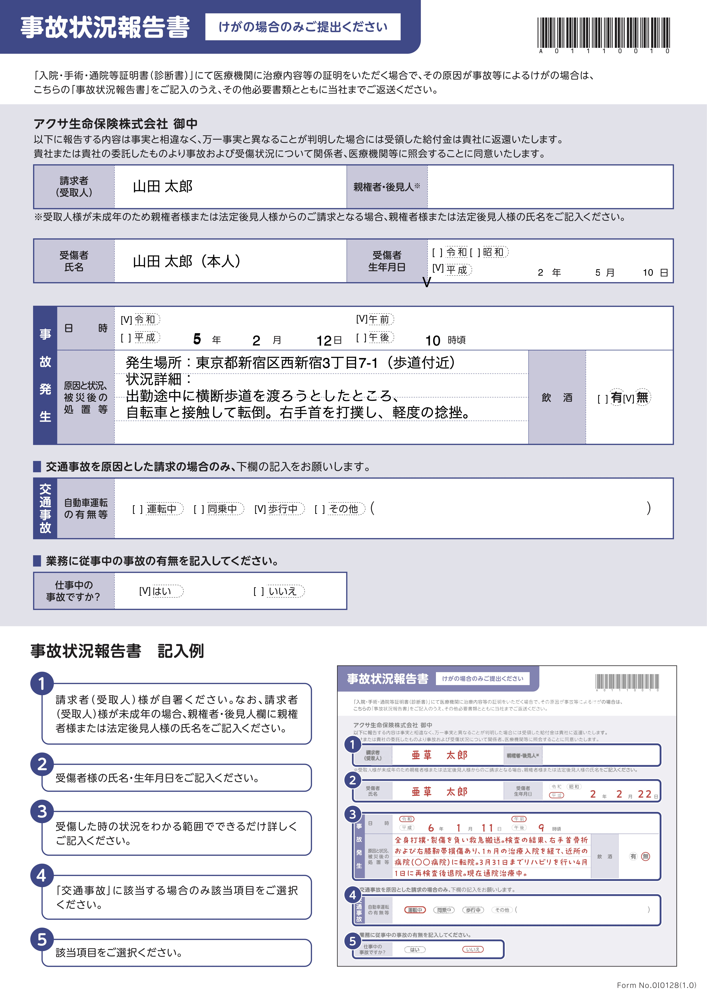


📋 Document Parse中...


weave: 🍩 https://wandb.ai/nhandsome/UPSTAGE-HANDSON-RESULTS-NEW-NEW/r/call/0199e7d1-8982-7753-8497-bc7862946db0



🧠 LLM応答を生成中...


weave: 🍩 https://wandb.ai/nhandsome/UPSTAGE-HANDSON-RESULTS-NEW-NEW/r/call/0199e7d1-aad1-77c1-84c3-8fbf6ba8c082



📦 JSON抽出中...

✅ 抽出結果（JSON）：
{
  "受傷者名前": "山田 太郎",
  "受傷者性別": "記載無し",
  "受傷者生年月日": "1990/05/10",
  "受傷者住所": "記載無し",
  "受傷の日時/日付": "2023/02/12",
  "受傷の日時/時間": "10:00",
  "受傷の場所": "東京都新宿区西新宿3丁目7-1 (歩道付近)",
  "受傷の原因": "自転車と接触",
  "受傷の内容": "右手首を打撲し、軽度の捻挫",
  "飲酒の有無": "有",
  "警察の届出/有無": "記載無し",
  "警察の届出/警察署名": "記載無し",
  "免許証番号": "記載無し",
  "免許証種類": "記載無し",
  "免許有効期間": "記載無し"
}

📄 抽出結果:
{'受傷者名前': '山田 太郎', '受傷者性別': '記載無し', '受傷者生年月日': '1990/05/10', '受傷者住所': '記載無し', '受傷の日時/日付': '2023/02/12', '受傷の日時/時間': '10:00', '受傷の場所': '東京都新宿区西新宿3丁目7-1 (歩道付近)', '受傷の原因': '自転車と接触', '受傷の内容': '右手首を打撲し、軽度の捻挫', '飲酒の有無': '有', '警察の届出/有無': '記載無し', '警察の届出/警察署名': '記載無し', '免許証番号': '記載無し', '免許証種類': '記載無し', '免許有効期間': '記載無し'}

📄 対象文書
   ファイル名: _FWD_Accident_Report.jpg
   サイズ: 2,310,846 バイト


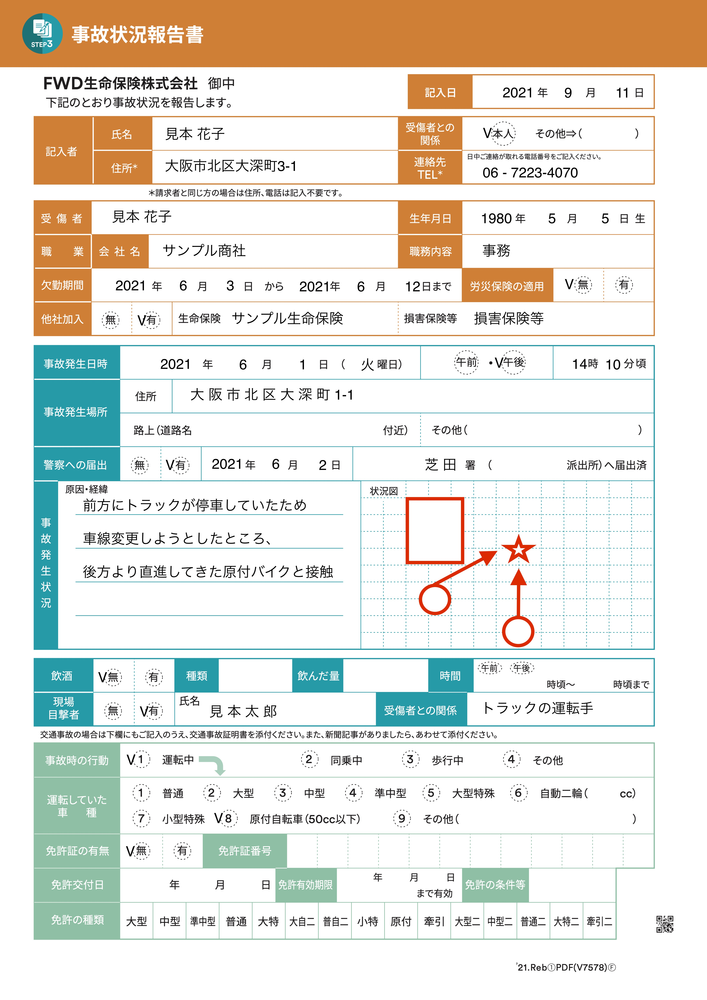

weave: 🍩 https://wandb.ai/nhandsome/UPSTAGE-HANDSON-RESULTS-NEW-NEW/r/call/0199e7d1-c30b-750b-9e2e-d7324cd64e2e



📋 Document Parse中...


weave: 🍩 https://wandb.ai/nhandsome/UPSTAGE-HANDSON-RESULTS-NEW-NEW/r/call/0199e7d1-c2e5-7d10-bbce-d00f7f0a92a0
weave: 🍩 https://wandb.ai/nhandsome/UPSTAGE-HANDSON-RESULTS-NEW-NEW/r/call/0199e7d1-e3ed-7c19-9fae-2d5a377c85c2



🧠 LLM応答を生成中...


weave: 🍩 https://wandb.ai/nhandsome/UPSTAGE-HANDSON-RESULTS-NEW-NEW/r/call/0199e7d2-0013-704d-896d-8763ead9d6e6



📦 JSON抽出中...

✅ 抽出結果（JSON）：
{
  "受傷者名前": "見本花子",
  "受傷者性別": "記載無し",
  "受傷者生年月日": "1980/05/05",
  "受傷者住所": "大阪市北区",
  "受傷の日時/日付": "2021/06/01",
  "受傷の日時/時間": "14:10",
  "受傷の場所": "大阪市北区大深町1-1",
  "受傷の原因": "前方にトラックが停車していたため車線変更しようとしたところ、後方より直進してきた原付バイクと接触",
  "受傷の内容": "記載無し",
  "飲酒の有無": "無",
  "警察の届出/有無": "有",
  "警察の届出/警察署名": "芝田署",
  "免許証番号": "記載無し",
  "免許証種類": "記載無し",
  "免許有効期間": "記載無し"
}

📄 抽出結果:
{'受傷者名前': '見本花子', '受傷者性別': '記載無し', '受傷者生年月日': '1980/05/05', '受傷者住所': '大阪市北区', '受傷の日時/日付': '2021/06/01', '受傷の日時/時間': '14:10', '受傷の場所': '大阪市北区大深町1-1', '受傷の原因': '前方にトラックが停車していたため車線変更しようとしたところ、後方より直進してきた原付バイクと接触', '受傷の内容': '記載無し', '飲酒の有無': '無', '警察の届出/有無': '有', '警察の届出/警察署名': '芝田署', '免許証番号': '記載無し', '免許証種類': '記載無し', '免許有効期間': '記載無し'}

📄 対象文書
   ファイル名: _Gibraltar_Accident_Report.jpg
   サイズ: 1,716,234 バイト


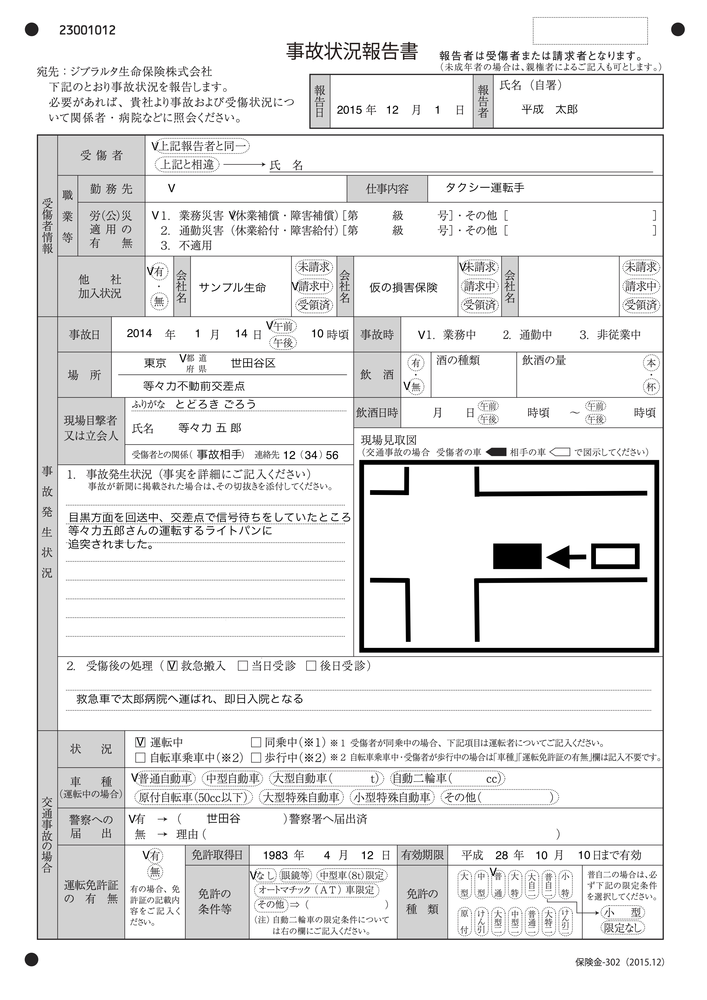

weave: 🍩 https://wandb.ai/nhandsome/UPSTAGE-HANDSON-RESULTS-NEW-NEW/r/call/0199e7d2-002d-7bc9-8d07-9168abfec751



📋 Document Parse中...


weave: 🍩 https://wandb.ai/nhandsome/UPSTAGE-HANDSON-RESULTS-NEW-NEW/r/call/0199e7d2-1b4a-7b6e-a528-3bf9939c4dd3



🧠 LLM応答を生成中...


weave: 🍩 https://wandb.ai/nhandsome/UPSTAGE-HANDSON-RESULTS-NEW-NEW/r/call/0199e7d2-36b8-74ac-a8bd-b17d6b4f0578



📦 JSON抽出中...

✅ 抽出結果（JSON）：
{
  "受傷者名前": "平成 太郎",
  "受傷者性別": "記載無し",
  "受傷者生年月日": "記載無し",
  "受傷者住所": "記載無し",
  "受傷の日時/日付": "2014/01/14",
  "受傷の日時/時間": "10:00",
  "受傷の場所": "東京都世田谷区等々力不動前交差点",
  "受傷の原因": "等々カ五郎さんの運転するライトパンに追突された",
  "受傷の内容": "救急車で太郎病院へ運ばれ、即日入院",
  "飲酒の有無": "無",
  "警察の届出/有無": "有",
  "警察の届出/警察署名": "世田谷警察署",
  "免許証番号": "記載無し",
  "免許証種類": "普通自動車",
  "免許有効期間": "2016/10/10"
}

📄 抽出結果:
{'受傷者名前': '平成 太郎', '受傷者性別': '記載無し', '受傷者生年月日': '記載無し', '受傷者住所': '記載無し', '受傷の日時/日付': '2014/01/14', '受傷の日時/時間': '10:00', '受傷の場所': '東京都世田谷区等々力不動前交差点', '受傷の原因': '等々カ五郎さんの運転するライトパンに追突された', '受傷の内容': '救急車で太郎病院へ運ばれ、即日入院', '飲酒の有無': '無', '警察の届出/有無': '有', '警察の届出/警察署名': '世田谷警察署', '免許証番号': '記載無し', '免許証種類': '普通自動車', '免許有効期間': '2016/10/10'}

📄 対象文書
   ファイル名: _Himawari_Accident_Report.jpg
   サイズ: 1,525,481 バイト


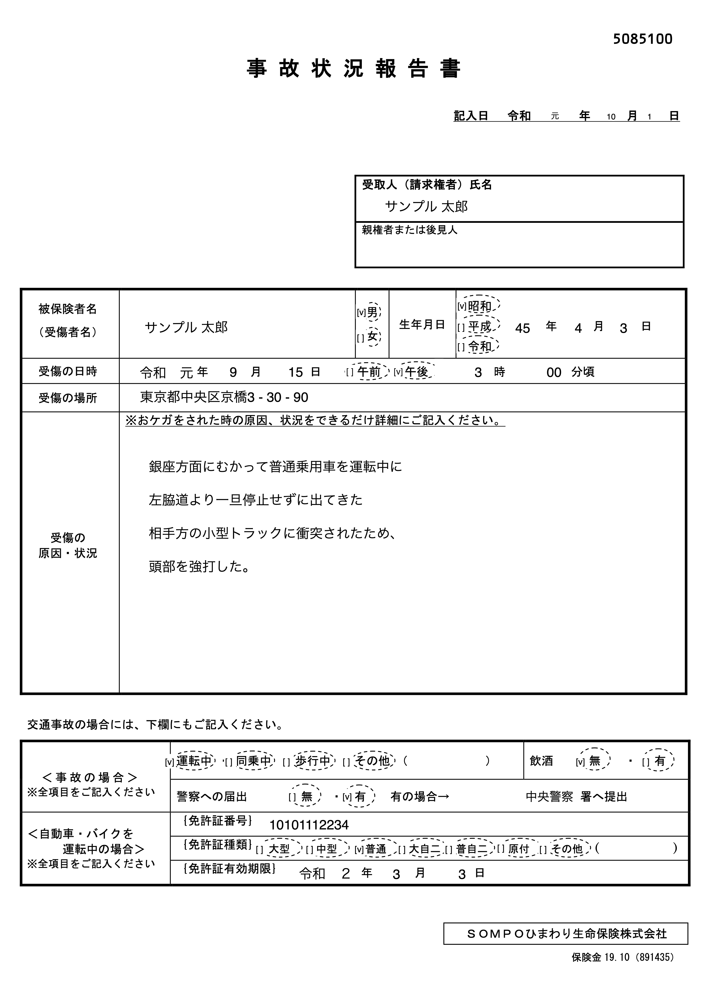

weave: 🍩 https://wandb.ai/nhandsome/UPSTAGE-HANDSON-RESULTS-NEW-NEW/r/call/0199e7d2-36d3-7774-bccc-8ccc0bfb35d1



📋 Document Parse中...


weave: 🍩 https://wandb.ai/nhandsome/UPSTAGE-HANDSON-RESULTS-NEW-NEW/r/call/0199e7d2-50ff-7b7b-9a47-11e9d38bd5cd



🧠 LLM応答を生成中...


weave: 🍩 https://wandb.ai/nhandsome/UPSTAGE-HANDSON-RESULTS-NEW-NEW/r/call/0199e7d2-64e3-7ed5-8cc8-1473c5e290a4



📦 JSON抽出中...

✅ 抽出結果（JSON）：
{
  "受傷者名前": "サンプル 太郎",
  "受傷者性別": "男",
  "受傷者生年月日": "1973/04/03",
  "受傷者住所": "記載無し",
  "受傷の日時/日付": "2019/09/15",
  "受傷の日時/時間": "15:00",
  "受傷の場所": "東京都中央区京橋3 - 30 - 90",
  "受傷の原因": "左脇道より一旦停止せずに出てきた相手方の小型トラックに衝突された",
  "受傷の内容": "頭部を強打した",
  "飲酒の有無": "無",
  "警察の届出/有無": "有",
  "警察の届出/警察署名": "中央警察署",
  "免許証番号": "10101112234",
  "免許証種類": "普通",
  "免許有効期間": "2020/03/03"
}

📄 抽出結果:
{'受傷者名前': 'サンプル 太郎', '受傷者性別': '男', '受傷者生年月日': '1973/04/03', '受傷者住所': '記載無し', '受傷の日時/日付': '2019/09/15', '受傷の日時/時間': '15:00', '受傷の場所': '東京都中央区京橋3 - 30 - 90', '受傷の原因': '左脇道より一旦停止せずに出てきた相手方の小型トラックに衝突された', '受傷の内容': '頭部を強打した', '飲酒の有無': '無', '警察の届出/有無': '有', '警察の届出/警察署名': '中央警察署', '免許証番号': '10101112234', '免許証種類': '普通', '免許有効期間': '2020/03/03'}

📄 対象文書
   ファイル名: _MSA-Life_Accident_Report.jpg
   サイズ: 2,590,586 バイト


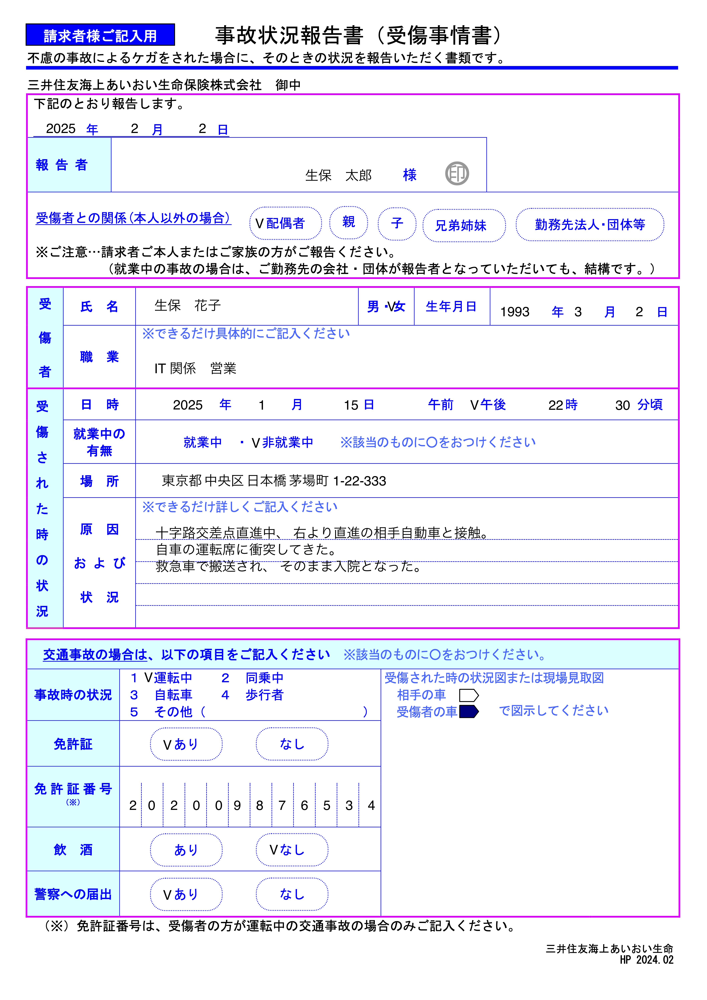

weave: 🍩 https://wandb.ai/nhandsome/UPSTAGE-HANDSON-RESULTS-NEW-NEW/r/call/0199e7d2-6500-79ae-b4bb-8457a895d698



📋 Document Parse中...


weave: 🍩 https://wandb.ai/nhandsome/UPSTAGE-HANDSON-RESULTS-NEW-NEW/r/call/0199e7d2-83cd-7efb-af86-a5b90c62d9de



🧠 LLM応答を生成中...

📦 JSON抽出中...

✅ 抽出結果（JSON）：
{
  "受傷者名前": "生保 花子",
  "受傷者性別": "女",
  "受傷者生年月日": "1993/03/02",
  "受傷者住所": "記載無し",
  "受傷の日時/日付": "2025/01/15",
  "受傷の日時/時間": "22:30",
  "受傷の場所": "東京都中央区 日本橋茅場町 1-22-333",
  "受傷の原因": "十字路交差点直進中、右より直進の相手自動車と接触",
  "受傷の内容": "自車の運転席に衝突してきた。救急車で搬送され、そのまま入院となった。",
  "飲酒の有無": "無",
  "警察の届出/有無": "有",
  "警察の届出/警察署名": "記載無し",
  "免許証番号": "202009876534",
  "免許証種類": "記載無し",
  "免許有効期間": "記載無し"
}

📄 抽出結果:
{'受傷者名前': '生保 花子', '受傷者性別': '女', '受傷者生年月日': '1993/03/02', '受傷者住所': '記載無し', '受傷の日時/日付': '2025/01/15', '受傷の日時/時間': '22:30', '受傷の場所': '東京都中央区 日本橋茅場町 1-22-333', '受傷の原因': '十字路交差点直進中、右より直進の相手自動車と接触', '受傷の内容': '自車の運転席に衝突してきた。救急車で搬送され、そのまま入院となった。', '飲酒の有無': '無', '警察の届出/有無': '有', '警察の届出/警察署名': '記載無し', '免許証番号': '202009876534', '免許証種類': '記載無し', '免許有効期間': '記載無し'}


weave: 🍩 https://wandb.ai/nhandsome/UPSTAGE-HANDSON-RESULTS-NEW-NEW/r/call/0199e7d2-9f1f-781a-ac46-325ab92941f7


In [3]:
# ======================================================
# 🪜 Step ① 解析対象ファイルの定義
# ------------------------------------------------------
# - 保険会社ごとに異なる事故状況報告書を複数枚まとめて処理
# - 各ファイルに対して同一のプロンプト（情報抽出設定）を適用
# - フォーマットが異なっても共通項目を抽出するユースケース
# ======================================================
sample_files = [
    "./demo_imgs/information_extraction/_AXA_Accident_Report.jpg",
    "./demo_imgs/information_extraction/_FWD_Accident_Report.jpg",
    "./demo_imgs/information_extraction/_Gibraltar_Accident_Report.jpg",
    "./demo_imgs/information_extraction/_Himawari_Accident_Report.jpg",
    "./demo_imgs/information_extraction/_MSA-Life_Accident_Report.jpg",
]

# ======================================================
# 🪜 Step ② 全ファイルに対する情報抽出処理
# ------------------------------------------------------
# - process_document_pipeline() により
#   ① HTML解析 → ② 段階的プロンプト適用 → ③ JSON抽出
# - 各ファイルごとの抽出結果を順番に出力
# ======================================================
for sample_file in sample_files:
    result_json = process_document_pipeline(
        sample_file,
        prompt1=PROMPT_1,
        prompt2=PROMPT_2,
        prompt3=PROMPT_3,
    )

    print("\n📄 抽出結果:")
    print(result_json)
